Información integrantes del equipo de trabajo

**Nombre y apellidos (Grupo):**

**Nombre y apellidos (Grupo):**

**Nombre y apellidos (Grupo):**

# Transformada de Fourier corta (SFT)


Cuando tenemos una señal con cierta periodicidad, la transformada de Fourier nos permite obtener la información de los datos, discernir señales del ruido, o incluso interpolar resultados. Sin embargo, en otros ámbitos, como es el de la industria musical, el cine, la radio, etc. las señales no se repiten indefinidamente en el tiempo (imaginar una canción, donde las notas van cambiando a lo largo del tiempo). Para este tipo de casos se suele emplear la transformada de Fourier corta (SFT por sus siglas en inglés) que representa la evolución del espectro de la señal a lo largo del tiempo.

### Apartado a:

- Considerando una frecuencia de muestreo de 44.1 KHz, definir una señal de 2 segundos que contenga varias frecuencias $\nu_i$, con distintas amplitudes cada una de ellas. Representar la señal y obtener el espectro de Fourier de dicha señal.

In [135]:
# Librerías

from numpy import loadtxt, linspace, arange, zeros, ones, array, sqrt, absolute, multiply, cos, sin, log
from numpy import append as appendArray # para que no se confunda con el `append` de python
from numpy.fft import rfft, irfft, fft
from cmath import exp, pi
from scipy.optimize import fsolve, curve_fit
from scipy.io import wavfile
from pylab import plot, show, scatter, xlabel, ylabel, imshow, xlim, ylim, title, figure,colorbar, subplots, GridSpec, subplot



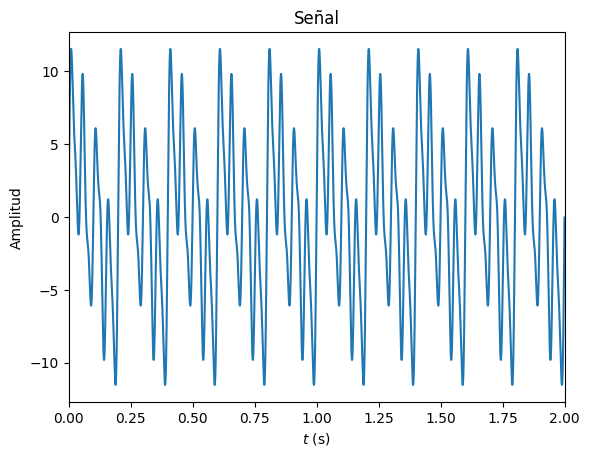

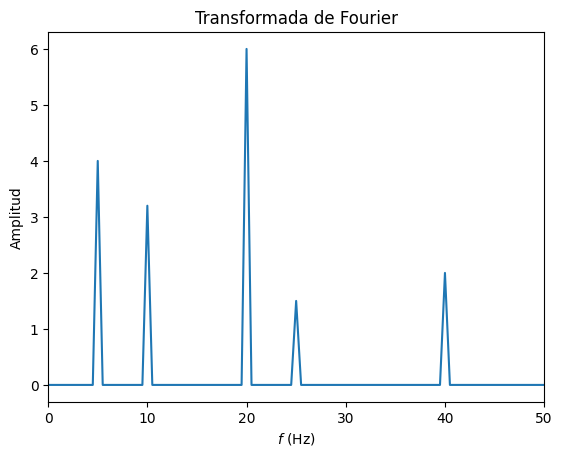

In [136]:
# constantes
muestreo = 44100
duracion1 = 2.0
frecuencias1 = array([5, 10, 20, 25, 40])
amplitudes1 = array([4.0, 3.2, 6.0, 1.5, 2.0])

# síntesis de la señal
t1 = arange(0.0, duracion1, 1/muestreo)
señal1 = zeros(t1.size)

for i in range(frecuencias1.size):
    señal1 += amplitudes1[i] * sin(2*pi*frecuencias1[i] * t1)

# representación de la señal
plot(t1, señal1)
xlabel('$t$ (s)')
ylabel('Amplitud')
title('Señal')
xlim([0, duracion1])
show()

# cálculo de su espectro
espectroAmplutides1 = rfft(señal1)
espectroFrecuencias1 = linspace(0, señal1.size//(2*duracion1), int((muestreo*duracion1)/2) + 1)

# representación de los coeficientes de la fft
plot(espectroFrecuencias1, (1/espectroAmplutides1.size)*abs(espectroAmplutides1))
xlabel('$f$ (Hz)')
ylabel('Amplitud')
title('Transformada de Fourier')
xlim([0.0, 50.0])
show()

- Crear una señal de 10 segundos, donde la frecuencia de la señal varía cada 2 segundos, es decir, una señal donde tenemos 5 frecuencias y cada una de ellas sólo está presente durante 2 segundos. Representar la señal y obtener el espectro total de Fourier

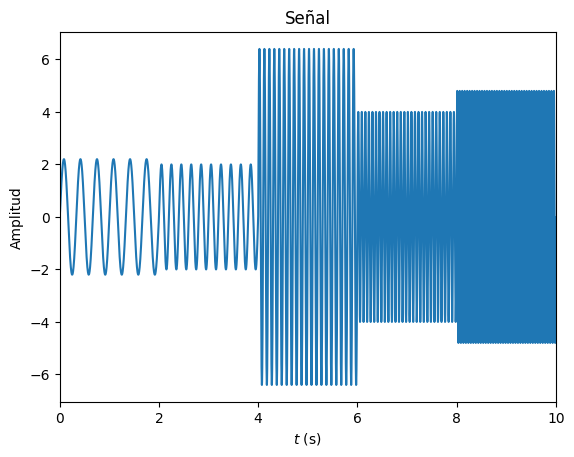

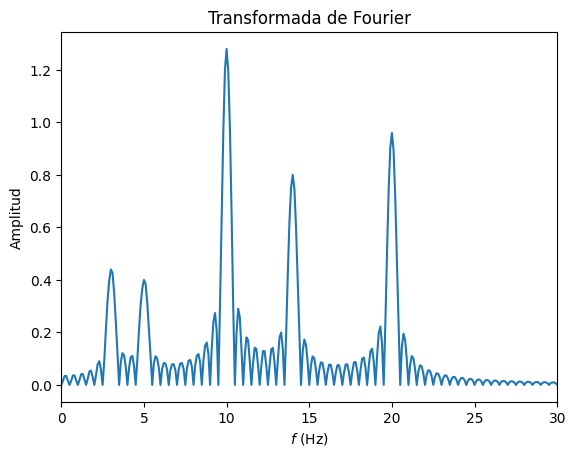

In [137]:
# constantes
duracion2 = 10.0
intervalo = 2.0
frecuencias2 = array([3, 5, 10, 14, 20])
amplitudes2 = array([2.2, 2, 6.4, 4.0, 4.8])

# síntesis de la señal
t2 = arange(0.0, duracion2, 1/muestreo)
señal2 = zeros(0)  # array vacío para añadir cada segmento
N = int(t2.size/(duracion2/intervalo))  # cantidad de muestras de cada segmento
for i in range(frecuencias2.size):
    señal2 = appendArray(señal2, amplitudes2[i] * sin(2*pi*frecuencias2[i] * t2[i*N:(i+1)*N]))

# representación de la señal
plot(t2, señal2)
xlabel('$t$ (s)')
ylabel('Amplitud')
title('Señal')
xlim([0, duracion2])
show()

# cálculo de su espectro
espectroAmplutides2 = rfft(señal2)
espectroFrecuencias2 = linspace(0, señal2.size//(2*duracion2), int((muestreo*duracion2)/2) + 1)

# representación de los coeficientes de la fft
plot(espectroFrecuencias2, (1/espectroAmplutides2.size)*abs(espectroAmplutides2))
xlabel('$f$ (Hz)')
ylabel('Amplitud')
title('Transformada de Fourier')
xlim([0.0, 30.0])
show()


Tal y como uno espera, la transformada de Fourier no distingue si una frecuencia desaparece de la señal o si perdura a lo largo de la misma. De esta manera se pierde cierta información que puede ser útil a la hora de analizar la señal, para su estudio o limpieza. Por el contrario, la SFT analiza trozos de la señal a lo largo del tiempo, de forma que se puede ver la evolución temporal de la misma.

### Apartado b:

- Definir una función SFT que tome como entrada la señal a estudiar, la frecuencia de muestreo, tamaño de los trozos a analizar (N) y cuanto se superponen las trozos que analizamos. Con esta información la función debe hacer lo siguiente:
   - Considerando el tamaño de los trozos y la superposición de los mismos, calcular el desplazamiento del segmento de trozo que analizamos
   - Calcular la cantidad de trozos que se deben analizar
   - Defina un vector (cos) del mismo tamaño que un trozo (N), cuyos elementos tomen los valores $x_i = 0.5-0.5cos(2\pi i/(N-1))$, con $i\in [0,N-1]$.
   - Cree un vector de ceros de tamaño N.
   - Definir un vector (v) de tamaño len(señal)+N, donde los N elementos finales sean cero y los primeros len(señal) sean la señal a analizar.
   - Crear un vector bidimensional de python de tipo flotante donde almacenar los resultados, es decir, con tantas filas como frecuencias vamos a tener, y tantas columnas como trozos se analizan.
   - Definir un loop que analice cada uno de los trozos, para lo cual debe realizar lo siguiente:
      - del vector v tomar el trozo de señal, de tamaño N que debemos analizar.
      - Suavizar los bordes del trozo usando el vector cos.
      - definimos un vector (datos) donde guardamos el trozo suavizado y a continuación N ceros.
      - Calculamos el espectro de Fourier
      - Guardamos en la columna correspondiente al trozo estudiado del vector resultados la primera mitad del espectro obtenido.
   - La función debe devolver el vector de resultados.
- Usando la función anterior, analizar y representar la evolución del espectro a lo largo del tiempo para la señal de 10 segundos de duración creada en los apartados anteriores. **AYUDA** El gráfico debe hacerse con imshow.

In [138]:
def sft(señal,f,N,sup):
    """
    Calcula la transformada corta de una señal empleando `rfft` del módulo `numpy.fft` en cada segmento.

    Inputs
    ------
    señal : ndarray
        Señal a transformar.
    f : float
        Frecuencia de muestreo de la señal.
    N : int
        Cantidad de muestras por segmento.
    sup : int
        Tamaño de la superposición entre segmentos por ambos lados.

    Outputs
    -------
    datos : ndarray
        Coeficientes de la transformada por segmentos.
    trozos : int
        Cantidad de segmentos en la que ha sido dividida la señal.T

    Notas
    -----
    Si se introducen los inputs de tamaño de un trozo y la superposicion de los trozos en segundos (que resulta más intuitivo para el que lo usa), entonces `N = int(tamaño*f)` y `sup = int(solapamiento*f)`.
    """
    desplazamiento = N-sup//2   # El /2 es debido a que `sup` representa los datos del trozo superpuestos a ambos lados, pero solo nos interesa los de uno de los lados
    
    trozos = len(señal)//desplazamiento # Número de trozos que tendremos para analizar

    print(f'Frecuencia de muestreo: {f} Hz.')
    print(f'Tamaño de la señal: {len(señal)} muestras.')
    print(f'Tamaño por segmento: {N} muestras.')
    print(f'Tamaño de la superposición: {sup} muestras.')
    print(f'Desplazamiento: {desplazamiento} muestras.')
    print(f'Número de trozos: {trozos}.')
    
    cosvect = 0.5-0.5*cos(2*pi*linspace(0,N,N)/(N-1))    
    
    ceros = zeros(N, float)
    v = appendArray(señal,ceros)
    
    datos = zeros([N+1,trozos], complex)    

    for i in range(trozos):
        trozo=v[desplazamiento*i:desplazamiento*i+N]    # Para coger la sección de la señal hay que guiarse por el parámetro desplazamiento, no N
        trozoHann=(trozo)*cosvect                       # Suavizado de la señal usando el vector (cos), tambien llamado "Hann window"
        espectroi = rfft(appendArray(trozoHann,ceros))                          
        datos[:,i] = espectroi
    
    return datos, trozos

def espectro_sft(señal,f,N,sup,flimit):
    """
    Representa la transformada corta de una señal empleando `sft`.

    Inputs
    ------
    señal : ndarray
        Señal a transformar.
    f : float
        Frecuencia de muestreo de la señal.
    N : int
        Cantidad de muestras por segmento.
    sup : int
        Tamaño de la superposición entre segmentos por ambos lados.
    flimit : float
        Parámetro para ajustar el `imshow`.
    """

    datos = abs(sft(señal,f,N,sup)[0])
    fig, ax = subplots(figsize=(30, 12))
    freclimit = (N+1)//flimit
    xlabel('$t$ (s)')
    ylabel('$f$ (Hz)')
    ax.imshow(datos[:freclimit,:], origin='lower',aspect='auto',extent=[0,len(señal)//f,0,(f//2-1)//flimit])    # Al ser un input real, el espectro útil solo va de 0---sr/2 Hz


#para el extra (si da tiempoy se me ocurre algo)
def señal_antiruido(señal,f,N,sup):
    Datos_ruido,trozos=sft(señal[:10*f],f,N,sup)
    #detectar una frecuencia que se repite continuamente e identificar de que tipo es el ruido
    #crear una señal de ese mismo tipo en negativo que dure lo que dura la canción
    antirruido=[]
    return antirruido


Frecuencia de muestreo: 44100 Hz.
Tamaño de la señal: 441000 muestras.
Tamaño por segmento: 44100 muestras.
Tamaño de la superposición: 22050 muestras.
Desplazamiento: 33075 muestras.
Número de trozos: 13.


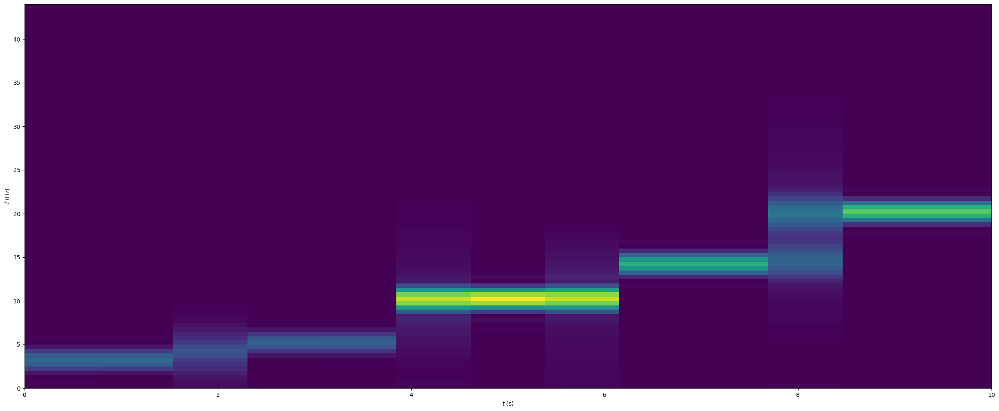

In [139]:
# Señal de 10 segundos del apartado anterior
muestreo = 44100
espectro_sft(señal2, muestreo, muestreo, muestreo//2, 500)  # flimit tiene que ser muy grande porque las frecuencias son muy bajas


- Usando la función SFT, analizar la señal contenida en el archivo `pista1.wav` que se carga a continuación y representar la SFT para la señal.

In [140]:
import IPython.display as ipd   # Librerias para leer archivos de audio
from scipy.io import wavfile
import librosa
import librosa.display

# librosa por defecto te resamplea los datos y los normaliza (valores entre -1 y 1)
señal, frec_muestreo = librosa.load("pista1.wav")

In [141]:
#Para escuchar el audio
ipd.Audio(señal,rate=frec_muestreo)

El archivo dura 88.34036281179138 segundos 

Señal librosa = 1947905 muestras
Frecuencia de muestreo de librosa = 22050


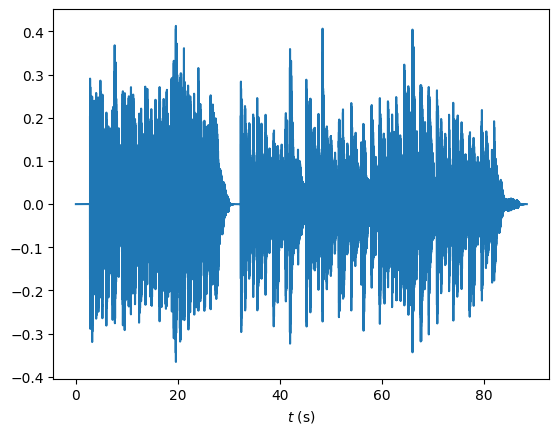

Señal scipy = 4240336
Drecuencia de muestreo de scipy = 48000


In [142]:
duracion = len(señal)/frec_muestreo
print(f'El archivo dura {duracion} segundos \n')

tiempo = arange(0.0, duracion, 1/frec_muestreo)

print(f'Señal librosa = {len(señal)} muestras')
print(f'Frecuencia de muestreo de librosa = {frec_muestreo}')
plot(tiempo, señal)
xlabel('$t$ (s)')
show()

# Esto no se emplea, es solo para mostrar que `scipy` da otro tipo de datos al leer el `.wav`: dos canales, el doble de datos por canal que librosa, y mayor frecuencia de muestreo.
nu, signal = wavfile.read('pista1.wav')
print(f'Señal scipy = {len(signal[:,0])}')
print(f'Drecuencia de muestreo de scipy = {nu}')

Frecuencia de muestreo: 22050 Hz.
Tamaño de la señal: 1947905 muestras.
Tamaño por segmento: 3000 muestras.
Tamaño de la superposición: 1500 muestras.
Desplazamiento: 2250 muestras.
Número de trozos: 865.


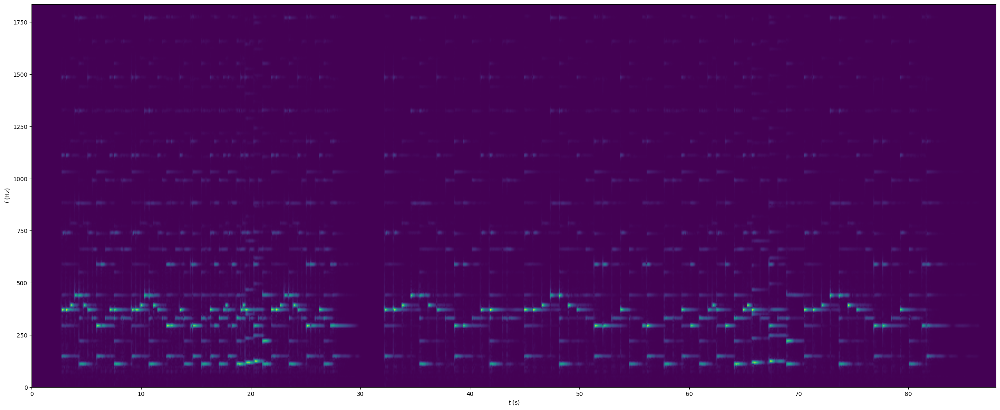

In [143]:
espectro_sft(señal,frec_muestreo,int(3000),int(1500),6) # flimit = 6 es adecuado para ver la melodía y los armónicos

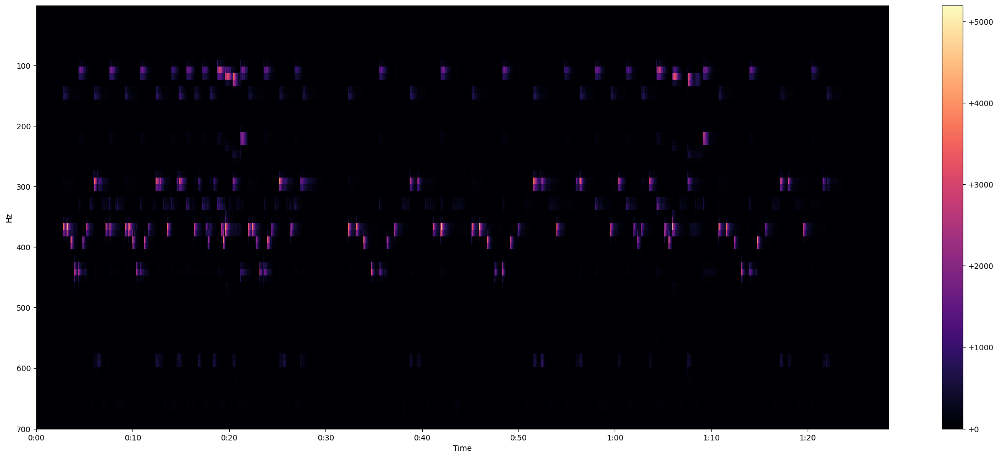

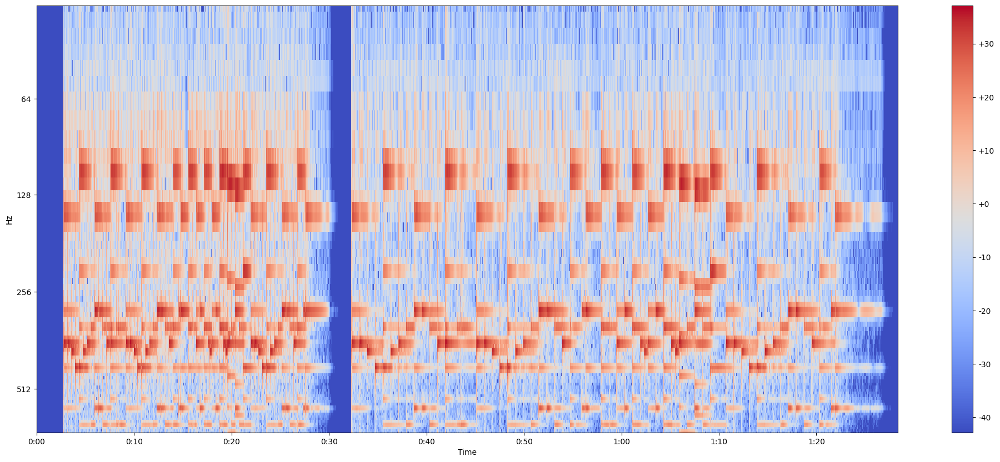

In [144]:
# Comparación con el output de las funciones de librosa

samples = 2048
hop = 512       # Estándares en la stft de audio

signal, sr = librosa.load("pista1.wav")

scale = librosa.stft(signal, n_fft=samples, hop_length=hop)

Yscale = abs(scale)**2

def espectrograma(Y, sr, hop_length, y_axis="linear"):
    figure(figsize=(25,10))
    ylim(700)
    librosa.display.specshow(Y, sr=sr, hop_length=hop_length, x_axis="time", y_axis=y_axis)
    colorbar(format="%+2.f")

espectrograma(Yscale,sr,hop)

Ylog = librosa.power_to_db(Yscale)
espectrograma(Ylog,sr,hop,y_axis="log")

### Apartado c:

- Viendo el espectro a lo largo del tiempo, añadir a la señal anterior "ruido" con frecuencia muy alta (o muy baja) y volver a analizar la señal resultante. **AYUDA**: usar una amplitud del orden de 0.1 para el "ruido"

Frecuencia de muestreo: 22050 Hz.
Tamaño de la señal: 1947905 muestras.
Tamaño por segmento: 3000 muestras.
Tamaño de la superposición: 1500 muestras.
Desplazamiento: 2250 muestras.
Número de trozos: 865.


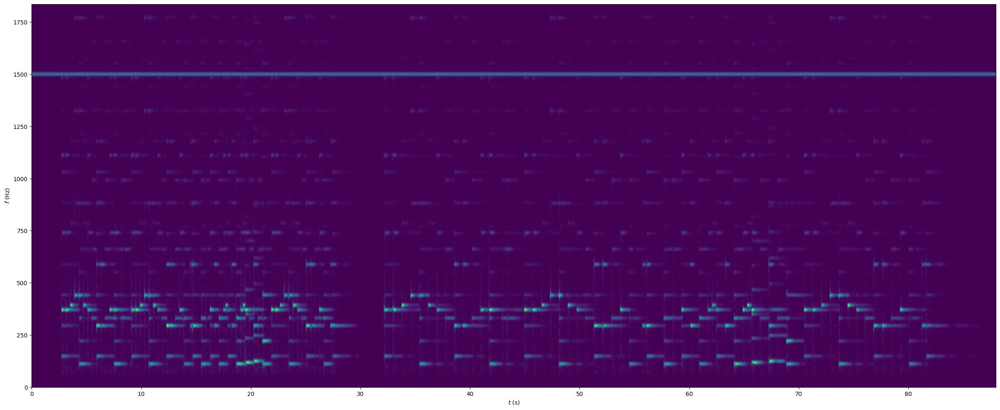

In [145]:
fruido = 1500   # Hz
ruido = 0.05*cos(2*pi*fruido*arange(0, len(señal)/frec_muestreo, 1/frec_muestreo))
señal_ruido = señal + ruido
espectro_sft(señal_ruido, frec_muestreo, 3000, 1500, 6)

In [146]:
ipd.Audio(señal_ruido,rate=frec_muestreo)

En muchas situaciones, pueden producirse estos ruidos indeseados. Según la situación en la que nos encontremos puede procederse de dos formas: En caso de haber ruido en los datos, se suelen aplicar filtro, es decir, se eliminan aquellas frecuencias molestas del espectro y se utiliza la transformada de Fourier inversa para recuperar la señal limpia. Otras veces, por ejemplo al escuchar música con unos auriculares, el ruido es ajeno al dispositivo. Sin embargo, hoy en día somos capaces de analizar dicho ruido (mediante el micrófono por ejemplo) y hacer que la señal emitida incluya una componente que anula el ruido ambiente.

- Haced la transformada de Fourier de la señal completa (incluido el ruido), aplicad un filtro (el que convenga según la situación) para eliminar el ruido (considerad que lo habéis construido vosotros y tenéis información del mismo). Para construir el filtro, definid un vector del mismo tamaño que la TF que tome valores 0 ó 1 según si las frecuencias queremos eliminarlas o no. Una vez limpiada la señal, volved a calcular la SFT y comprobad que se recupera el resultado original de la señal.

In [147]:
def rfftFiltro(señal, f, fcut, filterType, n):
    """
    Realiza la transformada de la señal y la filtra.

    Inputs
    ------
    señal : ndarray
        Señal a transformar.
    f : float
        Frecuencia de muestreo de la señal.
    fcut : float
        Frecuencia guía para el filtro.
    filterType : str, `lowpass`, `highpass` o `antibandpass`
        Tipo de filtro empleado en la señal.
    n : float
        Orden del filtrado. A mayor n, más precisa será la ventana.

    Outputs
    -------
    espectro_limpio : ndarray
        Espectro de la señal con el filtro aplicado.
    window : ndarray
        Valores de la ventana para el espacio de frecuencias.
    """
    espectro = rfft(señal)
    # t = linspace(0,len(espectro),len(espectro))
    t = linspace(0, f//2, len(señal)//2+1)
    # t = linspace(espectro.min(), espectro.max(), espectro.size)
    c = fcut
    if filterType == 'lowpass':
        window = 1/sqrt(1+(t/c)**(2*n))
    elif filterType == 'highpass':
        window = 1/sqrt(1+(t/c)**(-2*n))
    elif filterType == 'antibandpass':
        window = 1-1/(1+n/1000*(t-c)**2)
    espectro_limpio = espectro*window
    return espectro_limpio, window

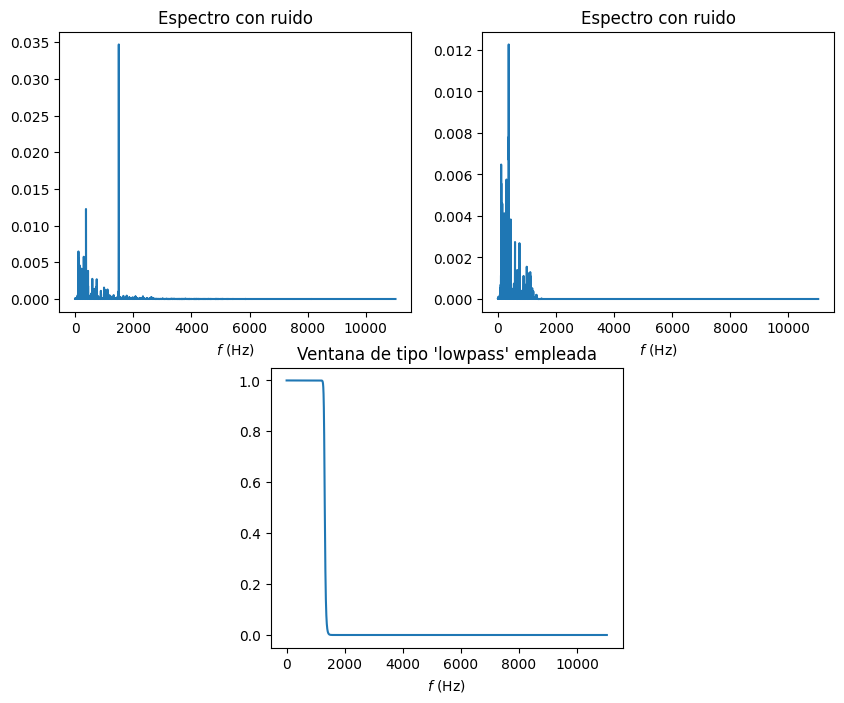

Frecuencia de muestreo: 22050 Hz.
Tamaño de la señal: 1947904 muestras.
Tamaño por segmento: 3000 muestras.
Tamaño de la superposición: 1500 muestras.
Desplazamiento: 2250 muestras.
Número de trozos: 865.


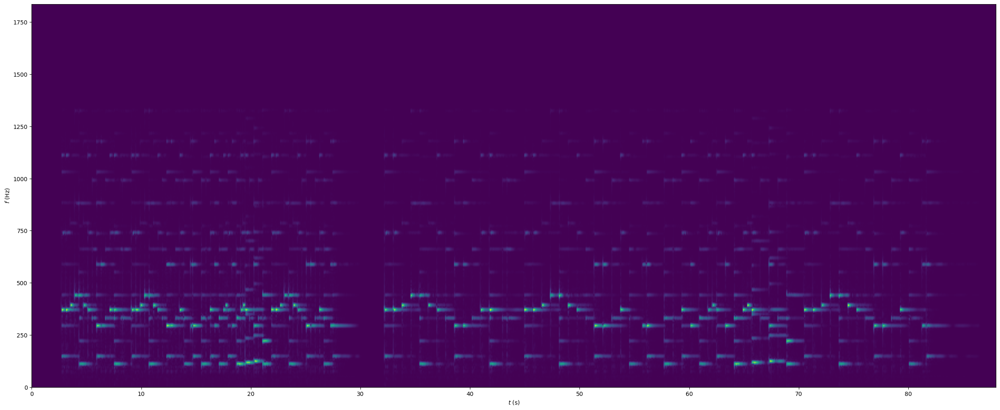

In [148]:
# Filtrado lowpass
rfftruido = rfft(señal_ruido)
filterType = 'lowpass'
espectro_limpio, window = rfftFiltro(señal_ruido, frec_muestreo, 1300, filterType, n=50)
x = linspace(0, frec_muestreo//2, len(señal_ruido)//2+1)

grid = GridSpec(2,4)
grid.update(wspace=0.5)

figure(figsize=(10,8))
subplot(grid[0,:2])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(rfftruido))*abs(rfftruido))

subplot(grid[0,2:])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(espectro_limpio))*abs(espectro_limpio))

subplot(grid[1,1:3])
title(f"Ventana de tipo '{filterType}' empleada")
xlabel('$f$ (Hz)')
plot(x, window)

show()

señalfiltrada = irfft(espectro_limpio)
espectro_sft(señalfiltrada, frec_muestreo, 3000,1500,6)

C:\Users\miqui\AppData\Local\Temp\ipykernel_18020\890792309.py:33: RuntimeWarning: divide by zero encountered in power
  window = 1/sqrt(1+(t/c)**(-2*n))
C:\Users\miqui\AppData\Local\Temp\ipykernel_18020\890792309.py:33: RuntimeWarning: overflow encountered in power
  window = 1/sqrt(1+(t/c)**(-2*n))


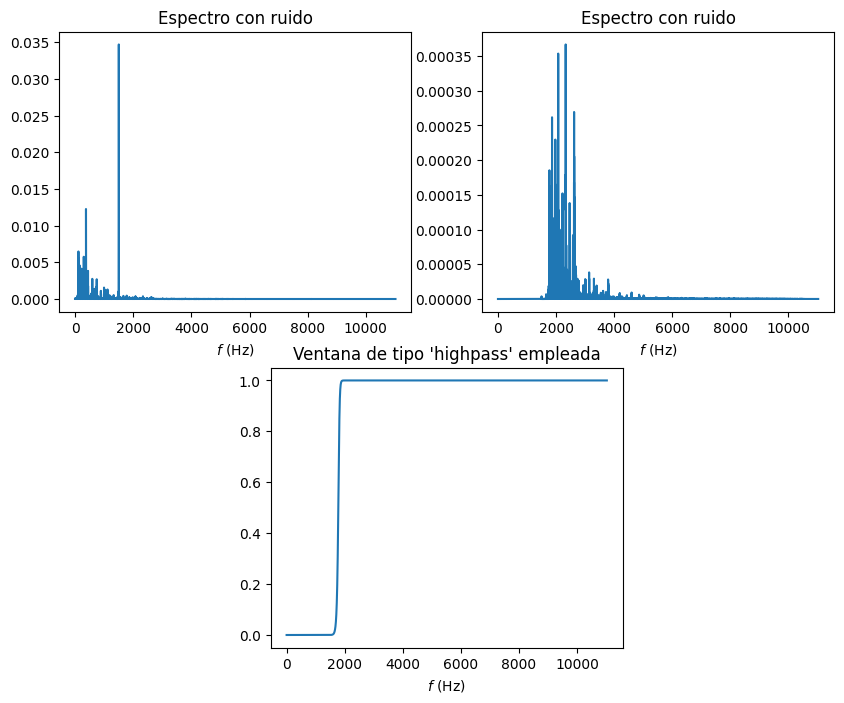

Frecuencia de muestreo: 22050 Hz.
Tamaño de la señal: 1947904 muestras.
Tamaño por segmento: 3000 muestras.
Tamaño de la superposición: 1500 muestras.
Desplazamiento: 2250 muestras.
Número de trozos: 865.


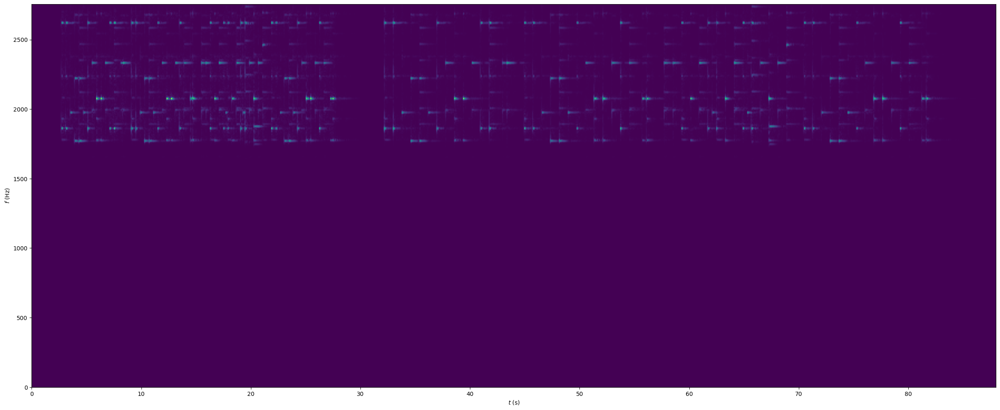

In [149]:
# Filtrado highpass
rfftruido = rfft(señal_ruido)
filterType = 'highpass'
espectro_limpio, window = rfftFiltro(señal_ruido, frec_muestreo, 1800, filterType, n=50)
x = linspace(0, frec_muestreo//2, len(señal_ruido)//2+1)

grid = GridSpec(2,4)
grid.update(wspace=0.5)

figure(figsize=(10,8))
subplot(grid[0,:2])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(rfftruido))*abs(rfftruido))

subplot(grid[0,2:])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(espectro_limpio))*abs(espectro_limpio))

subplot(grid[1,1:3])
title(f"Ventana de tipo '{filterType}' empleada")
xlabel('$f$ (Hz)')
plot(x, window)

show()

señalfiltrada = irfft(espectro_limpio)
espectro_sft(señalfiltrada, frec_muestreo, 3000,1500,4)

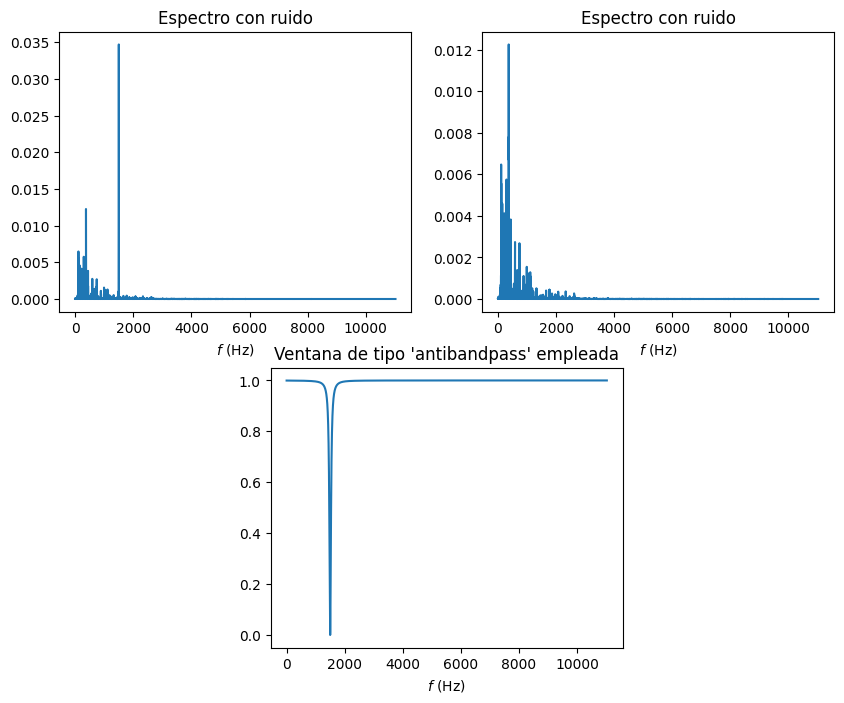

Frecuencia de muestreo: 22050 Hz.
Tamaño de la señal: 1947904 muestras.
Tamaño por segmento: 3000 muestras.
Tamaño de la superposición: 1500 muestras.
Desplazamiento: 2250 muestras.
Número de trozos: 865.


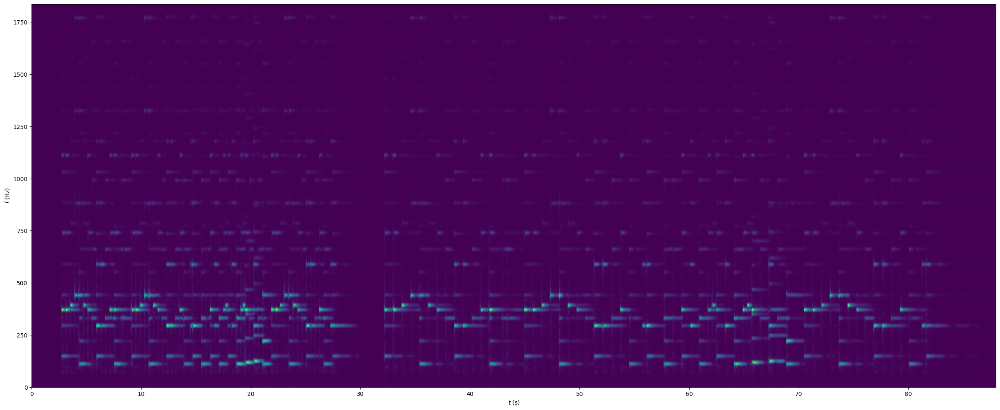

In [150]:
# Filtrado antibandpass
rfftruido = rfft(señal_ruido)
filterType = 'antibandpass'
espectro_limpio, window = rfftFiltro(señal_ruido, frec_muestreo, 1500, filterType, n=1)
x = linspace(0, frec_muestreo//2, len(señal_ruido)//2+1)

grid = GridSpec(2,4)
grid.update(wspace=0.5)

figure(figsize=(10,8))
subplot(grid[0,:2])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(rfftruido))*abs(rfftruido))

subplot(grid[0,2:])
title('Espectro con ruido')
xlabel('$f$ (Hz)')
plot(x, (1/len(espectro_limpio))*abs(espectro_limpio))

subplot(grid[1,1:3])
title(f"Ventana de tipo '{filterType}' empleada")
xlabel('$f$ (Hz)')
plot(x, window)

show()

señalfiltrada = irfft(espectro_limpio)
espectro_sft(señalfiltrada, frec_muestreo, 3000,1500,6)

**EXTRA** Usando los primeros 10 segundos de la señal con ruido, cread una señal que cancele el ruido para el resto de la señal. Añadirlo a la señal con el ruido y volved a representar la SFT